#SNA PROJECT
##**Social network graph of non-graphomaniac poet A.Voznesensky**
###Justification of the project.
Famouse russian poet Andrey Voznesensky (1933-2010) had very extensive connections, among his friends and acquaintances there are a lot of famous people and many people with world fame (Pablo Picasso, Kennedy and Reagan families, Bob Dylan, Arthur MIller, Martin Heidegger, Albert Camus, Jean-Paul Sartre etc.), which makes interesting to analyzing his social network.

###Data.
The dataset for this project was collected by me on the basis of A.Voznesensky biography and autobiography and Wikipedia materials. The project presents an analysis based on the data collected at the time of the project, which is an intermediate stage. The next step is to collect data from the poet's personal archive.

Almost all of the poet's contacts are presented on Wikipedia, which allows to collect some commin parameters. One of them is the number of awards and honors. It is also possible to analyze the publicity of these people by encoding the number of creative heritage units (in this project, a simple scale of 0-3 is used). Some people have a lot of awards and a small publicity and vice versa. And at the same time, this people have different quantity of contacts.
###Hypothesis:
for Voznesensky's circle of contacts (most of them are so-called "sixties"), the number of awards and honors depends on social activity.

###Graph visualization
Based on the collected dataset, there was build a graph in Gephi. He turned out to be very ego-centric

**Ego-graph visualization (fragment):** https://github.com/DariaTM/A_Voznesensky_SNA/blob/master/A_Voznesensky%20SNA/AV_ego_graph.png

so for the purposes of this project, the central node (A.Voznesensky) was removed from the network, so it turned out to be more uniform.

**Project data graph visualization** (color = profession): https://github.com/DariaTM/A_Voznesensky_SNA/blob/master/A_Voznesensky%20SNA/SNA-wAV.pdf

In [ ]:
import networkx as nx
import pandas as pd
import matplotlib.pyplot as plt # for network vizualization
import numpy as np
import random

In [ ]:
from networkx.algorithms.community import greedy_modularity_communities
from networkx.algorithms.community import asyn_lpa_communities
import community
import random
from networkx.algorithms import community
from community import community_louvain
from sklearn.metrics import normalized_mutual_info_score
from sklearn.metrics import mutual_info_score
from sklearn.metrics import adjusted_mutual_info_score
%matplotlib inline
from IPython.display import display, HTML, display_pretty
import os

In [ ]:
# Reading data from collected dataset
df_nodes = pd.read_excel('https://github.com/DariaTM/A_Voznesensky_SNA/raw/master/A_Voznesensky%20SNA/SNA-data_wAV2.xlsx', sheet_name='NODES-AV')
df_edges = pd.read_excel('https://github.com/DariaTM/A_Voznesensky_SNA/raw/master/A_Voznesensky%20SNA/SNA-data_wAV2.xlsx', sheet_name='EDGES-AV')

In [ ]:
df_nodes.head()

,ID,LABEL,GENDER,PROFESSION,AWARDS,PUBLICITY,BIRTH_PLACE,BIRTH
0,1,Антонина Сергеевна Пастушихина,Ж,слово,0,0,Москва,1905
1,2,Андрей Николавевич Вознесенский,М,издательское дело,1,0,Москва,1903
2,3,Наталья Андреевна Воознесенская,Ж,прочее,0,0,Москва,1930
3,4,Зоя Борисовна Богуславская,Ж,литература,1,2,Москва,1924
4,5,Борис Моисеевич Каган,М,наука,2,2,Белорусия,1918


In [ ]:
# Creation of an empty praph
G = nx.Graph()

# Add nodes and attributes
for i, node_data in df_nodes.iterrows():
      G.add_node(node_data['ID'],
      Label=node_data['LABEL'],
      Gender=node_data['GENDER'],
      Profession=node_data['PROFESSION'],
      Awards=node_data['AWARDS'],
      Publicity=node_data['PUBLICITY'],
      Birthpl=node_data['BIRTH_PLACE'],
      Birth=node_data['BIRTH'])

# Add edges and attributes
for i, edge_data in df_edges.iterrows():
    G.add_edge(edge_data['SOURCE'],
    edge_data['TARGET'],
    Weight=edge_data['WEIGHT'])

## Some descriptive statistics of network

* **average degree():** average number of edges adjacent to node
* **max degree():** maximum number of edges adjacent to node
* **density():** ratio of the number of edges to the maximum possible

In [ ]:
print('\nLen of nodes: ', len(G.nodes), '| Len of edges: ', len(G.edges))
print('Number of connected components: {}'.format(nx.number_connected_components(G)))
connected_components = [i for i in nx.connected_components(G)]
largest_cc = G.subgraph(max(connected_components, key=len))
print('Sizes of connected components:',[len(c) for c in sorted(connected_components, key=len, reverse=True)])
print('Number of isolated nodes: {}'.format(len(list(nx.isolates(G)))))
avg_deg = float(G.number_of_edges()) / G.number_of_nodes()
print("Average degree: ", round(avg_deg, 2))
print("Max degree: ", max(list(dict(G.degree()).values())))
print("Median degree: ", int(np.median(list(dict(G.degree()).values()))))
print("Density: ", round(nx.density(G),2))


Len of nodes:  291 | Len of edges:  634
Number of connected components: 1
Sizes of connected components: [291]
Number of isolated nodes: 0
Average degree:  2.18
Max degree:  54
Median degree:  3
Density:  0.02


In [ ]:
# Gender ratio
df_nodes.groupby('GENDER')['ID'].count()

GENDER
Ж     69
М    222
Name: ID, dtype: int64

In [ ]:
# Proffessions in network
df_nodes.groupby('PROFESSION')['ID'].count()

PROFESSION
архитектура                    4
балет                          2
журналистика                   4
издательское дело              7
искусство                     18
культура                       2
лит-ра, журналистика          32
литература                    89
литература, искусство          6
литература, музыка             5
литература, театр-кино         9
мода                           2
музыка                        18
наука                          4
политика                      11
прочее                        12
религия                        2
слово                          7
театр-кино                    45
театр-кино, искусство          2
театр-кино, музыка             8
театр-кино, музыка, лит-ра     2
Name: ID, dtype: int64

# Graph visualization

In [ ]:
#Labels collecting
labels_dict_G = dict()
for i in range(len(list(df_nodes['LABEL'].values))):
    labels_dict_G[df_nodes['ID'][i]] = df_nodes['LABEL'][i]

/usr/local/lib/python3.10/dist-packages/networkx/drawing/nx_pylab.py:450: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  node_collection = ax.scatter(


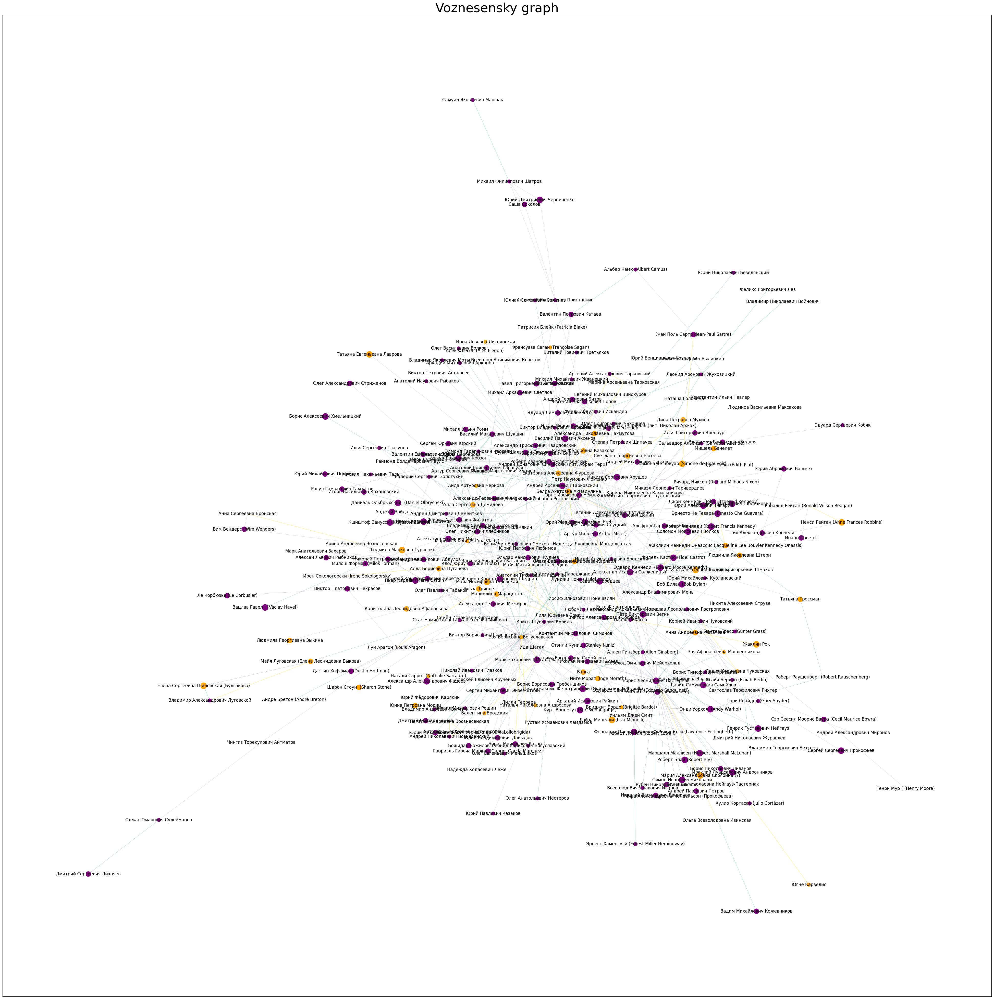

In [ ]:
plt.figure(figsize=(50,50))

# Nodes size = node Weight attribute
node_size = [G.nodes[node]['Awards']*100 for node in G]

# Nodes color = GENDER
node_color = ['orange' if node_data['GENDER']=='Ж' else 'purple' for i, node_data in df_nodes.iterrows()]

# Edge size = edge Weight attribute
edge_weights = [edge_data['Weight'] for u, v, edge_data in G.edges(data=True)]
edge_width = [w * 0.1 for w in edge_weights]

nx.draw_networkx(G,
                 node_size=node_size,
                 node_color=node_color,
                 cmap=plt.cm.viridis,
                 edge_color=edge_weights,
                 edge_cmap=plt.cm.viridis,
                 width=edge_width,
                 with_labels=True,
                 labels=labels_dict_G)
plt.title('Voznesensky graph', fontsize=36)
plt.show()

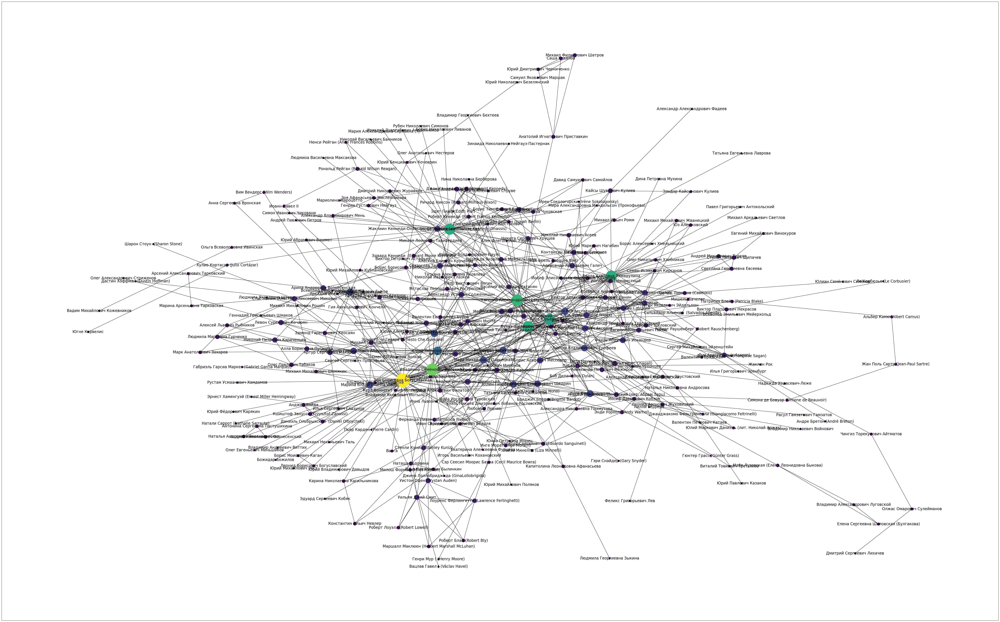

In [ ]:
# Central people in network visualization
k = nx.degree(G)
labels={nd: G.nodes[nd]['Label'] for (nd) in G.nodes()}
plt.figure(1, figsize=(80,50))
coord = nx.spring_layout(G, k=0.15,iterations=35)
nx.draw_networkx(G,
                 pos=coord,
                 nodelist=dict(k).keys(),
                 node_size = [v*70 for v in dict(k).values()],
                 node_color=[v for v in dict(k).values()],
                 font_size=17,
                 labels=labels,
                 )
#plt.savefig('AV_network.png')
plt.show()

#Social network analysis
## Distance

* **shortest path():** the shortest path between two nodes.
* **shortest_path_length():** distance of the shortest path.
* **average_shortest_path_length():** average distance between every pair of nodes.
* **diameter():** maximum between every pair of nodes.
* **radius():** diameter / 2.
* **eccentricity():** largest distance between a node and all the other nodes.
* **periphery():** set of nodes that have eccentricity equal to the diameter.
* **center():** set of nodes that have eccetricity equal to the radius (minimum eccentricity).

In [ ]:
print('Shortest path: ', nx.shortest_path(G, 1, 5))
print('Shortest path length: ', nx.shortest_path_length(G, 1, 5))
print('Average shortest path: ', nx.average_shortest_path_length(G))
print('Diameter: ', nx.diameter(G))
print("Radius:", nx.diameter(G) // 2)
print('Eccentricity: ', nx.eccentricity(G))
print('Periphery nodes: ', nx.periphery(G))
print('Center nodes: ', nx.center(G))

Shortest path:  [1, 4.0, 5]
Shortest path length:  2
Average shortest path:  3.4848678753406803
Diameter:  9
Radius: 4
Eccentricity:  {1: 6, 2: 6, 3: 6, 4: 5, 5: 6, 6: 6, 7: 7, 8: 6, 9: 6, 10: 7, 11: 7, 12: 8, 13: 7, 14: 7, 15: 6, 16: 6, 19: 6, 20: 6, 21: 6, 22: 6, 23: 6, 24: 6, 25: 6, 26: 6, 27: 6, 28: 6, 31: 6, 34: 6, 35: 7, 36: 6, 38: 6, 39: 6, 40: 6, 41: 7, 42: 6, 43: 7, 44: 6, 45: 6, 46: 6, 48: 6, 49: 6, 50: 5, 51: 5, 52: 6, 53: 5, 54: 7, 55: 5, 56: 6, 57: 6, 58: 5, 59: 6, 60: 5, 61: 7, 62: 7, 63: 7, 64: 7, 65: 8, 66: 6, 67: 5, 71: 6, 72: 7, 73: 6, 74: 6, 75: 6, 77: 9, 80: 6, 81: 6, 82: 7, 83: 8, 84: 6, 87: 6, 89: 6, 90: 6, 91: 7, 92: 6, 93: 6, 94: 7, 95: 6, 96: 5, 97: 6, 99: 6, 100: 7, 102: 6, 103: 9, 104: 6, 105: 6, 107: 9, 109: 7, 110: 6, 111: 5, 112: 6, 113: 6, 115: 7, 117: 6, 118: 6, 119: 6, 120: 6, 121: 6, 122: 7, 123: 7, 124: 7, 125: 6, 126: 6, 127: 6, 129: 5, 130: 7, 132: 6, 133: 6, 134: 5, 135: 6, 136: 5, 137: 7, 138: 6, 139: 6, 140: 7, 141: 7, 142: 7, 143: 8, 144: 5, 145

In [ ]:
# Add to dataframe

eccentricity_coefficients = nx.eccentricity(G)

# Add an "Eccentricity" column to df_nodes
df_nodes["Eccentricity"] = pd.NA

# Assign clustering coefficients to nodes based on their IDs
for node, coefficient in eccentricity_coefficients.items():
    df_nodes.loc[df_nodes["ID"] == node, "Eccentricity"] = coefficient

df_nodes['Eccentricity'] = df_nodes['Eccentricity'].astype(int)

#df_nodes.head()

## Clustering

The Clustering is the tendency for nodes in a network to become connected. Therefore, this allows us to understand what new connections can be between the nodes of a network.
We can define two types of clustering:

In [ ]:
# Global Clustering Coefficient (Transitivity): ratio between the number of closed triangles and the total number of triangles.
# This measure the clustering of the whole network
nx.transitivity(G)

0.14695009242144177

In [ ]:
# Local Clustering Coefficient of a node: measure of how neighbours of a node tend to form a complete graph
nx.clustering(G)

{1: 1.0,
 2: 1.0,
 3: 1.0,
 4: 0.029350104821802937,
 5: 1.0,
 6: 1.0,
 7: 1.0,
 8: 0.09523809523809523,
 9: 0.1794871794871795,
 10: 1.0,
 11: 1.0,
 12: 0,
 13: 0,
 14: 0.06666666666666667,
 15: 0.3333333333333333,
 16: 0.6,
 19: 0,
 20: 0.5333333333333333,
 21: 0,
 22: 0,
 23: 0,
 24: 0,
 25: 0,
 26: 1.0,
 27: 0,
 28: 0.32727272727272727,
 31: 0.10714285714285714,
 34: 0,
 35: 0.6666666666666666,
 36: 1.0,
 38: 0.47619047619047616,
 39: 0.4,
 40: 0.07575757575757576,
 41: 0.5,
 42: 0,
 43: 0.5,
 44: 0,
 45: 1.0,
 46: 0.2,
 48: 0,
 49: 0.3333333333333333,
 50: 0.7,
 51: 0.0944741532976827,
 52: 0.4666666666666667,
 53: 0.2857142857142857,
 54: 0,
 55: 0.045454545454545456,
 56: 0,
 57: 0,
 58: 0.3333333333333333,
 59: 0,
 60: 0.0766488413547237,
 61: 0,
 62: 0,
 63: 0,
 64: 0.5238095238095238,
 65: 0,
 66: 0,
 67: 0.2948717948717949,
 71: 0,
 72: 0,
 73: 0,
 74: 0.09175377468060394,
 75: 0,
 77: 1.0,
 80: 0,
 81: 0.21428571428571427,
 82: 0,
 83: 0,
 84: 1.0,
 87: 0,
 89: 0.8333333333

In [ ]:
# Add local clustering coefficients (LCC) to df

clustering_coefficients = nx.clustering(G)

# Add an "LCC" column to df_nodes
df_nodes["LCC"] = pd.NA

# Assign clustering coefficients to nodes based on their IDs
for node, coefficient in clustering_coefficients.items():
    #df_nodes.loc[df_nodes["ID"] == node, "LCC"] = coefficient
    df_nodes.loc[df_nodes["ID"] == node, "LCC"] = round(coefficient, 3)

# Assuming your DataFrame is named 'df' and the column to convert is 'column_name'
df_nodes['LCC'] = pd.to_numeric(df_nodes['LCC'], errors='coerce')

#df_nodes.head()

## Network Centrality
Some measures that identify the most important nodes in the network.
* **nx.degree_centrality(G):** number of links incident upon a node: more links a node has, the more important it is.
* **nx.closeness_centrality(G):** the average length of the shortest path between the node and all other nodes in the graph: important nodes are close to other nodes.
* **nx.betweenness_centrality(G):** the number of times a node acts as a bridge along the shortest path between two other nodes: important nodes connect other nodes.
* **nx.eigenvector_centrality(G):** influence of a node in a network. It assigns relative scores to all nodes in the network based on the concept that connections to high-scoring nodes contribute more to the score of the node in question than equal connections to low-scoring nodes.

In [ ]:
def centralities(G: nx.Graph):
    """
    Calculate degree, closeness, betweenness, eigenvector centralities of the graph
    """
    return {
        'degree': np.array([dc for dc in nx.degree_centrality(G).values()]),
        'closeness': np.array([dc for dc in nx.closeness_centrality(G).values()]),
        'betweenness': np.array([dc for dc in nx.betweenness_centrality(G).values()]),
        'eigenvector': np.array([dc for dc in nx.eigenvector_centrality(G).values()])
    }

In [ ]:
def top10_centralities(G: nx.Graph):
    """
    Create table of top 10 nodes by degree, closeness, betweenness, eigenvector centralities
    """
    cases = [['degree', nx.degree_centrality(G)],
             ['closeness', nx.closeness_centrality(G)],
             ['betweenness', nx.betweenness_centrality(G)],
             ['eigenvector', nx.eigenvector_centrality(G)]]
    dfs = {}
    for title, centrality in cases:
        top = sorted(centrality.items(), key=lambda i: i[1], reverse=True)[:10]
        name = [G.nodes[i]['Label'] for i, val in top]
        centr_value = [val for i, val in top]
        dfs[title] = pd.DataFrame({'Label': name,
                                   'centrality': centr_value})
    return dfs

In [ ]:
c = centralities(G)
top_dfs = top10_centralities(G)

Degree centrality


,Label,centrality
0,Зоя Борисовна Богуславская,0.186207
1,Владимир Семёнович Высоцкий,0.144828
2,Евгений Александрович Евтушенко,0.124138
3,Белла Ахатовна Ахмадулина,0.117241
4,Булат Шалвович Окуджава,0.117241
5,Борис Леонидович Пастернак,0.113793
6,Лиля Юрьевна Брик,0.110345
7,Юрий Петрович Любимов,0.065517
8,Иосиф Александрович Бродский,0.048276
9,Андрей Арсеньевич Тарковский,0.044828


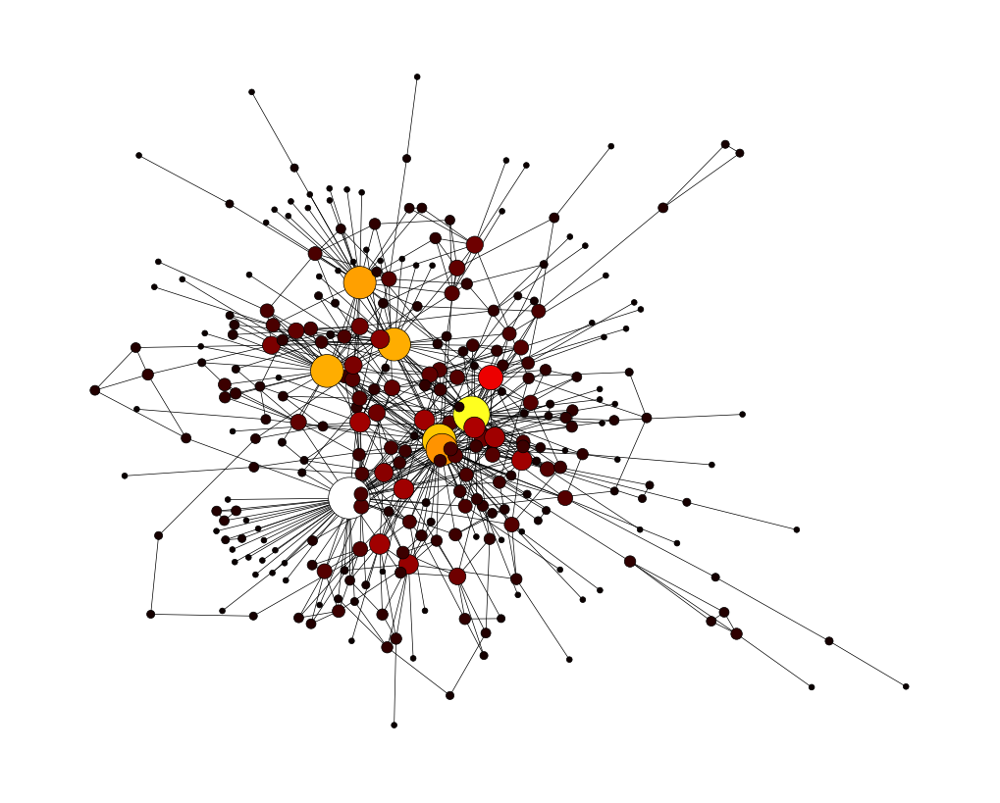

Closeness centrality


,Label,centrality
0,Евгений Александрович Евтушенко,0.433483
1,Зоя Борисовна Богуславская,0.427099
2,Владимир Семёнович Высоцкий,0.414878
3,Булат Шалвович Окуджава,0.411348
4,Белла Ахатовна Ахмадулина,0.407876
5,Лиля Юрьевна Брик,0.405028
6,Вениамин Борисович Смехов,0.401107
7,Борис Леонидович Пастернак,0.397260
8,Майя Михайловна Плесецкая,0.386667
9,Юрий Петрович Любимов,0.386667


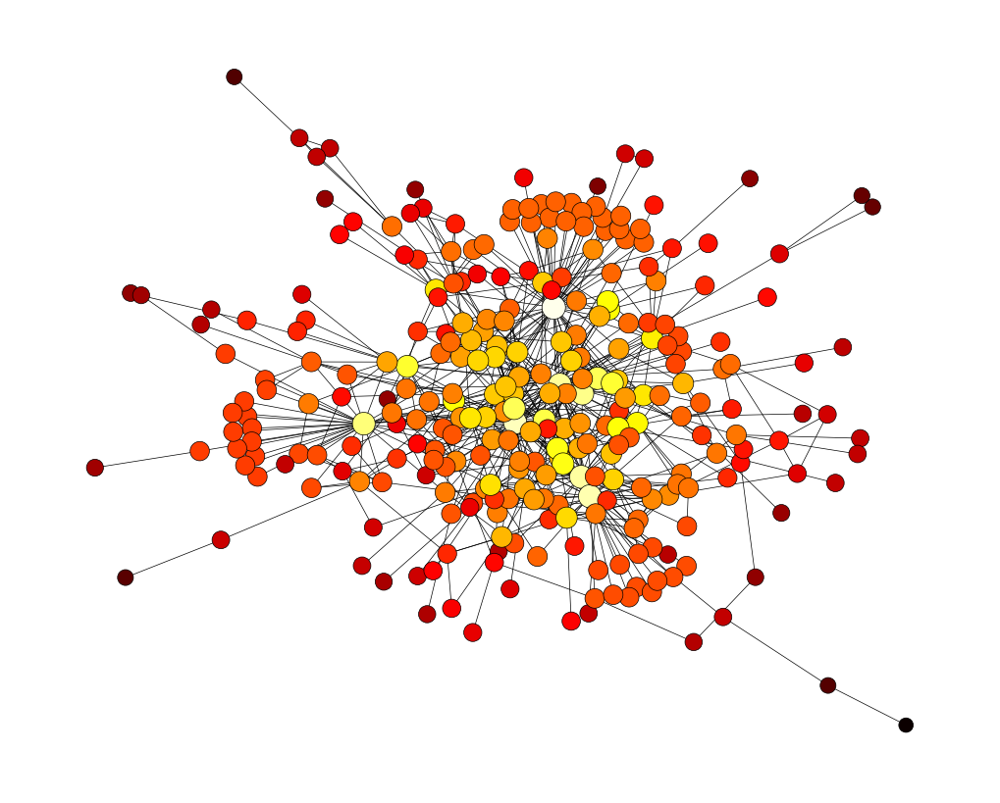

Betweenness centrality


,Label,centrality
0,Зоя Борисовна Богуславская,0.258979
1,Евгений Александрович Евтушенко,0.232447
2,Борис Леонидович Пастернак,0.174036
3,Владимир Семёнович Высоцкий,0.154992
4,Лиля Юрьевна Брик,0.148534
5,Булат Шалвович Окуджава,0.140214
6,Белла Ахатовна Ахмадулина,0.121843
7,Юрий Петрович Любимов,0.062375
8,Иосиф Александрович Бродский,0.052752
9,Андрей Арсеньевич Тарковский,0.045816


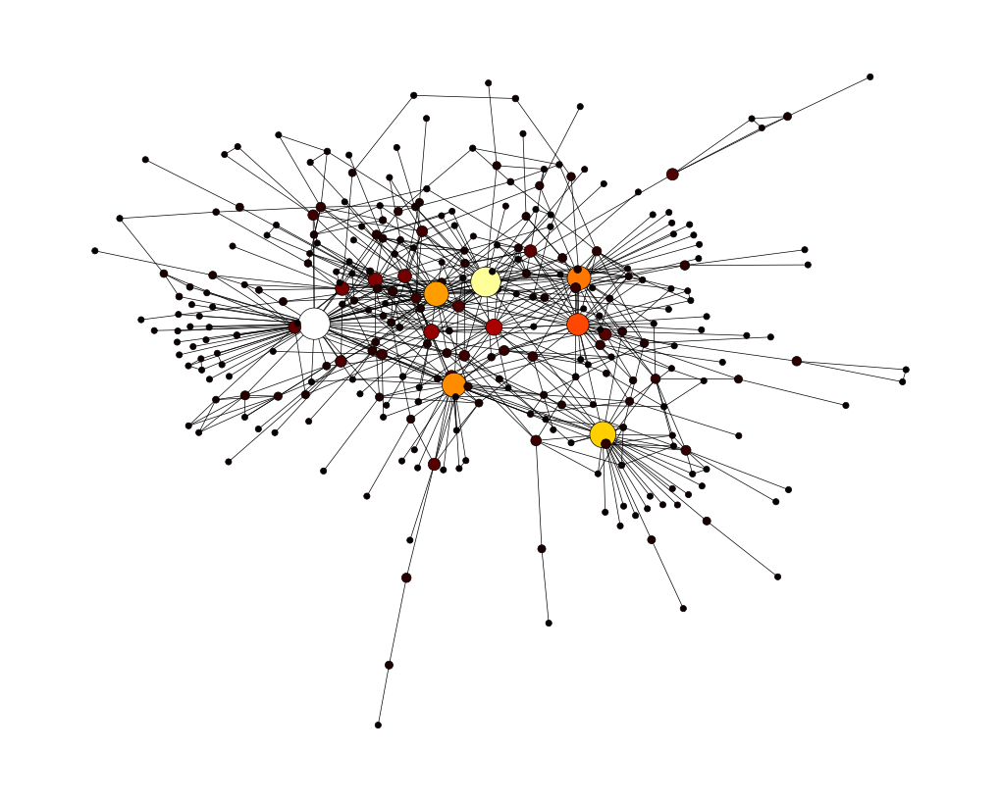

Eigenvector


,Label,centrality
0,Владимир Семёнович Высоцкий,0.341952
1,Зоя Борисовна Богуславская,0.314027
2,Булат Шалвович Окуджава,0.240248
3,Евгений Александрович Евтушенко,0.229953
4,Белла Ахатовна Ахмадулина,0.227577
5,Лиля Юрьевна Брик,0.200602
6,Вениамин Борисович Смехов,0.188164
7,Юрий Петрович Любимов,0.167177
8,Майя Михайловна Плесецкая,0.147319
9,Родион Константинович Щедрин,0.136440


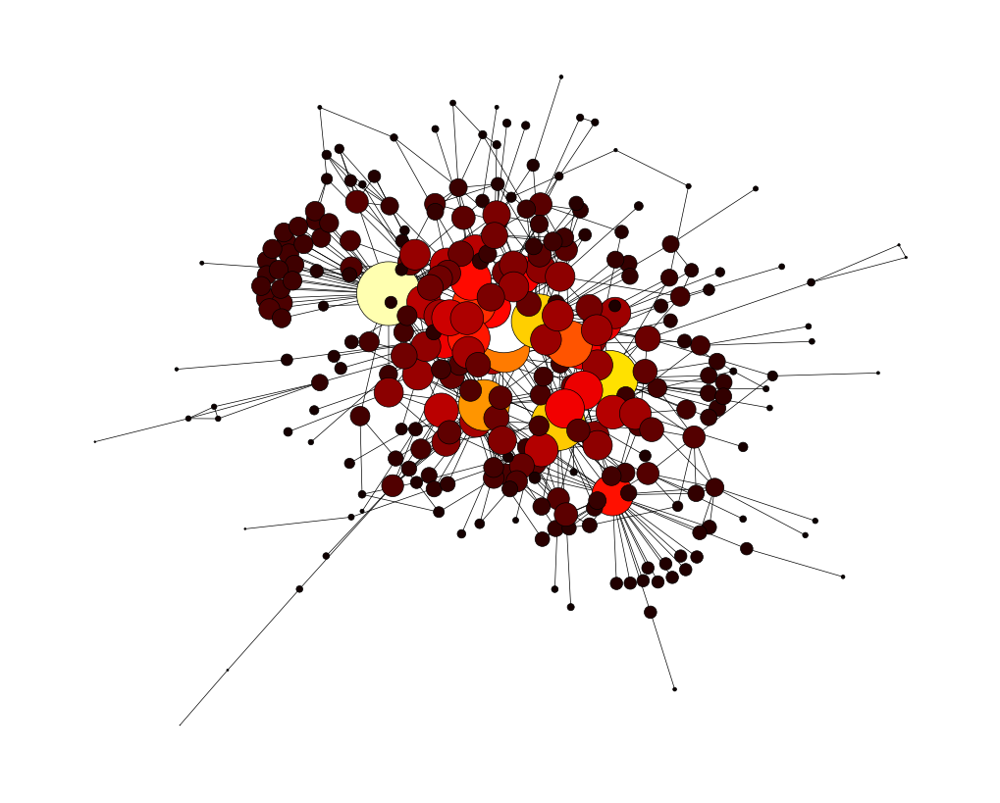

In [ ]:
cases = [['degree', 5000, 0, 'Degree centrality'],
         ['closeness', 700, 0, 'Closeness centrality'],
         ['betweenness', 2000, 20, 'Betweenness centrality'],
         ['eigenvector', 7000, 0, 'Eigenvector']]
for c_key, scale, bias, title in cases:
    print(title)
    display(top_dfs[c_key])
    plt.figure(figsize=(10, 8))
    #node_labels = {n: G.nodes[n]['Label'] for n in G.nodes if n in c[c_key]}
    nx.draw(G,
            width=0.5,
            linewidths=0.5,
            edgecolors='black',
            cmap=plt.cm.hot,
            node_size=c[c_key]*scale + bias,
            node_color=c[c_key])
            #labels=labels)
    plt.show()


In [ ]:
# Add Centralities to df

#DC_coefficients = nx.degree_centrality(G)
CC_coefficients = nx.closeness_centrality(G)
BC_coefficients = nx.betweenness_centrality(G)
EV_coefficients = nx.eigenvector_centrality(G)

# Add new column to df
#df_nodes['DC'] = pd.NA
df_nodes["CC"] = pd.NA
df_nodes["BC"] = pd.NA
df_nodes["EV"] = pd.NA

#for node, coefficient in DC_coefficients.items():
    #df_nodes.loc[df_nodes["ID"] == node, "DC"] = round(coefficient, 3)
for node, coefficient in CC_coefficients.items():
    df_nodes.loc[df_nodes["ID"] == node, "CC"] = round(coefficient, 3)
for node, coefficient in BC_coefficients.items():
    df_nodes.loc[df_nodes["ID"] == node, "BC"] = round(coefficient, 3)
for node, coefficient in EV_coefficients.items():
    df_nodes.loc[df_nodes["ID"] == node, "EV"] = round(coefficient, 3)

# Assuming your DataFrame is named 'df' and the column to convert is 'column_name'
#df_nodes['DC'] = pd.to_numeric(df_nodes['CC'], errors='coerce')
df_nodes['CC'] = pd.to_numeric(df_nodes['CC'], errors='coerce')
df_nodes['BC'] = pd.to_numeric(df_nodes['BC'], errors='coerce')
df_nodes['EV'] = pd.to_numeric(df_nodes['EV'], errors='coerce')

# Print the updated df_nodes DataFrame
df_nodes.head()


,ID,LABEL,GENDER,PROFESSION,AWARDS,PUBLICITY,BIRTH_PLACE,BIRTH,Eccentricity,LCC,CC,BC,EV
0,1,Антонина Сергеевна Пастушихина,Ж,слово,0,0,Москва,1905,6,1.000,0.300,0.000,0.034
1,2,Андрей Николавевич Вознесенский,М,издательское дело,1,0,Москва,1903,6,1.000,0.300,0.000,0.034
2,3,Наталья Андреевна Воознесенская,Ж,прочее,0,0,Москва,1930,6,1.000,0.300,0.000,0.034
3,4,Зоя Борисовна Богуславская,Ж,литература,1,2,Москва,1924,5,0.029,0.427,0.259,0.314
4,5,Борис Моисеевич Каган,М,наука,2,2,Белорусия,1918,6,1.000,0.300,0.000,0.031


## Community detection

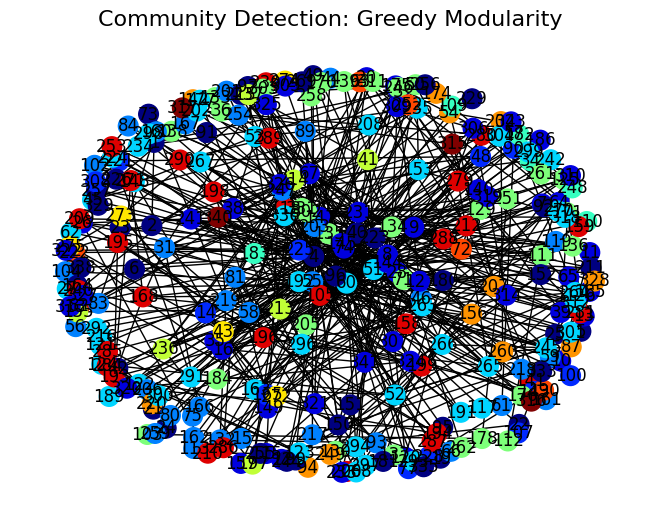

In [ ]:
# Greedy community detection method
def detect_greedy_modularity_communities(G):
    communities = community.greedy_modularity_communities(G)
    return sorted(sorted(c) for c in communities)

# Layout for node positioning
pos = nx.spring_layout(G)

# Function for visualization (you can customize this as needed)
def show_communities(G, pos, name, communities):
    colors = np.linspace(0, 1, len(communities))
    color_map = {node: colors[i] for i, comm in enumerate(communities) for node in comm}
    nx.draw(G, pos = nx.spring_layout(G, k=0.8), node_color=[color_map.get(node, 0) for node in G.nodes], with_labels=True, cmap=plt.cm.jet, node_size=200)
    plt.title(f'Community Detection: {name}', fontsize=16)

# Detect communities using the specified method
communities = detect_greedy_modularity_communities(G)

# Visualization (passing communities as argument)
show_communities(G, pos, name='Greedy Modularity', communities=communities)

# Display the graph with communities
plt.show()

Here picture is not informative, but its more comfortable to analyse this communities as a text list.

In [ ]:
#Greedy community detection method result

result = detect_greedy_modularity_communities(G)

for i, community in enumerate(result):
    print(f"Community{i+1}:")
    for node in community:
        print(f"ID: {node} - Name: {G.nodes[node]['Label']}")

Community1:
ID: 1 - Name: Антонина Сергеевна Пастушихина
ID: 2 - Name: Андрей Николавевич Вознесенский
ID: 3 - Name: Наталья Андреевна Воознесенская
ID: 4 - Name: Зоя Борисовна Богуславская
ID: 5 - Name: Борис Моисеевич Каган
ID: 6 - Name: Леонид Борисович Богуславский
ID: 19 - Name: Бриджит Бордо (Brigitte Bardot)
ID: 21 - Name: Натали Саррот (Nathalie Sarraute)
ID: 22 - Name: Лайза Минелли (Liza Minnelli)
ID: 23 - Name: Аркадий Исаакович Райкин
ID: 24 - Name: Михаил Михайлович Рощин
ID: 25 - Name: Рустам Усмаанович Хамдамов
ID: 40 - Name: Аллен Гинзберг (Allen Ginsberg)
ID: 42 - Name: Анатолий Тихонович Гладилин
ID: 49 - Name: Инге Морат (Inge Morath)
ID: 73 - Name: Владимир Андреевич Виттих
ID: 91 - Name: Гэри Снайдер (Gary Snyder)
ID: 92 - Name: Гюнтер Грасс (Günter Grass)
ID: 95 - Name: Джанджакомо Фельтринелли (Giangiacomo Feltrinelli)
ID: 96 - Name: Инге Фельтринелли
ID: 97 - Name: Джина Лоллобриджида (GinaLollobrigida)
ID: 99 - Name: Дмитрий Львович Быков
ID: 150 - Name: Марк З

In [ ]:
# Add a "Communities" column to df

df_nodes["Communities"] = pd.NA

# Assign communities to nodes based on their IDs
for i, community in enumerate(communities):
    for node in community:
        df_nodes.loc[df_nodes["ID"] == node, "Communities"] = i + 1

df_nodes['Communities'] = pd.to_numeric(df_nodes['Communities'], errors='coerce')

#df_nodes.head()

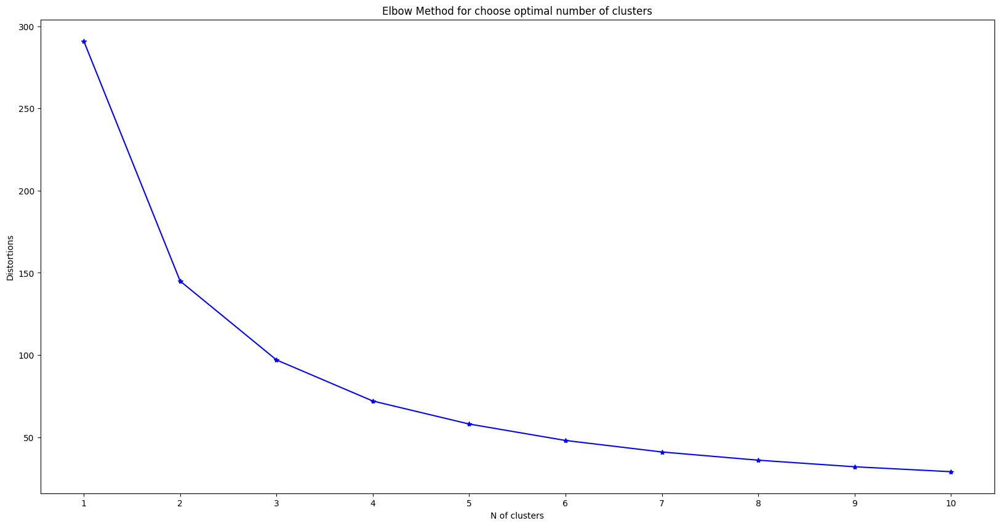

In [ ]:
# Cluster calculation
def calculate_clusters(nodes, number_of_clusters=''):
    db = AgglomerativeClustering(n_clusters=number_of_clusters).fit(np.array(nodes))
    labels = db.labels_
    return labels
dists = []
for k in range(1, 11):
    dists.append(int(len(G.nodes())/k))

number_of_clusters = range(1, 11)
plt.figure(figsize=(20,10))
plt.plot(number_of_clusters, dists, '-b*')
plt.xticks(number_of_clusters)
plt.xlabel('N of clusters')
plt.ylabel('Distortions')
plt.title('Elbow Method for choose optimal number of clusters')
plt.show()

From picture we see that 3 is optimal, but let's take 5.

## Spectral clustering with KMeans

p.s.bayanpy algorithm doesn't work (seems like network is too large for it)

In [ ]:
# Check for isolated nodes (optional)
isolated_nodes = [n for n in G.nodes if G.degree[n] == 0]
if isolated_nodes:
    print(f"Warning: Isolated nodes found: {isolated_nodes}")
    # Handle isolated nodes (e.g., remove them or assign a separate cluster)

# Check for missing nodes in df_nodes (compared to G)
missing_nodes = [n for n in G.nodes if n not in df_nodes['ID'].to_list()]
if missing_nodes:
    print(f"Warning: Missing nodes in df_nodes: {missing_nodes}")
    # Handle missing nodes (e.g., add them or exclude from spectral clustering)

In [ ]:
from sklearn.cluster import KMeans

def norm_laplacian(A):
    G = nx.from_numpy_array(A)
    L = nx.normalized_laplacian_matrix(G).toarray()
    return L

def spectral_embedding(L, n_components):
    vals, vecs = np.linalg.eigh(L)
    return vecs[:, 1:n_components + 1]

# Spectral Clustering for community detection
def spectral_clustering(G, n_clusters, n_components):
    A = nx.to_numpy_array(G)
    L = nx.normalized_laplacian_matrix(G).toarray()
    embedding = spectral_embedding(L, n_clusters)
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)  # Set random state for reproducibility
    kmeans.fit(embedding)
    return kmeans.labels_

# Detect communities using Spectral Clustering
node_clusters = spectral_clustering(G, 5, 0)  # Specify the number of clusters (7 in this case)

# Add cluster labels to the df_nodes DataFrame
df_nodes['CLUSTER'] = node_clusters
df_nodes['CLUSTER'] = df_nodes['CLUSTER'].astype(int)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [ ]:
pos = nx.kamada_kawai_layout(G)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


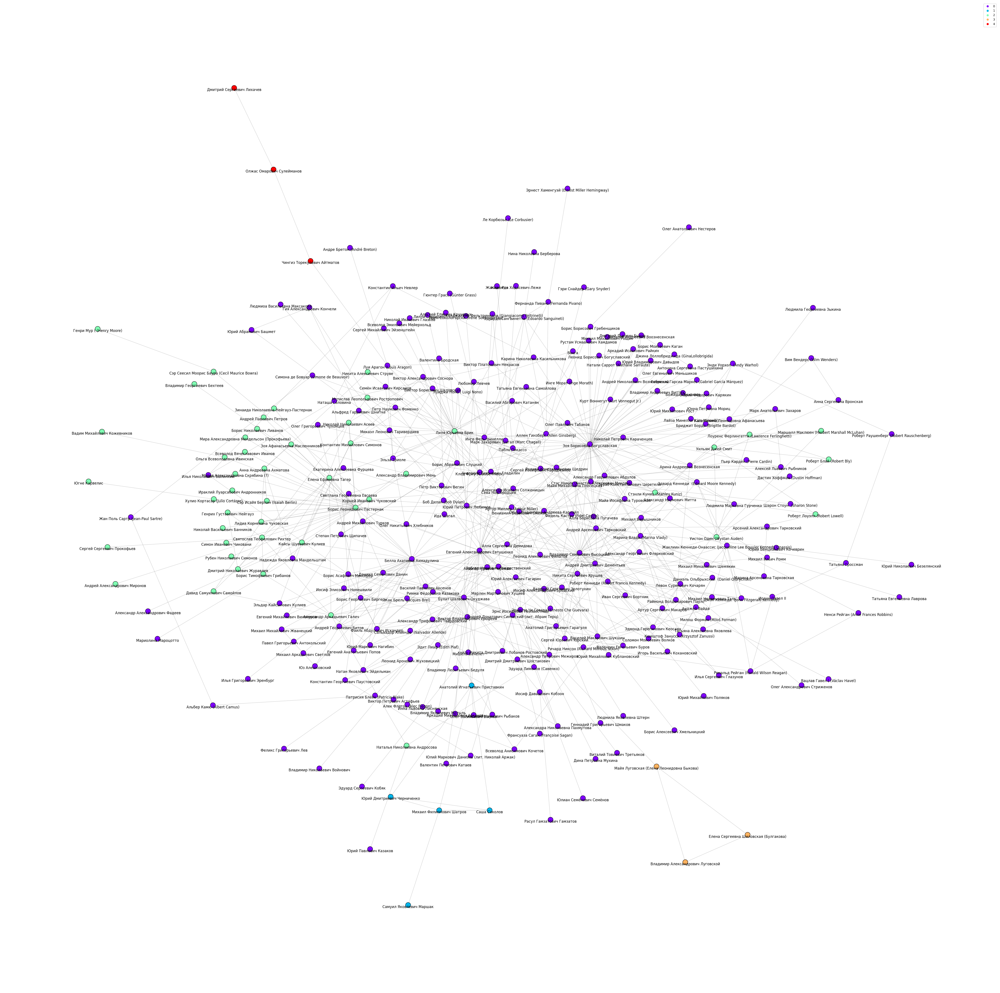

In [ ]:
plt.figure(figsize=(30*2, 30*2))
nodes = nx.draw_networkx_nodes(
    G,
    pos,
    cmap=plt.cm.rainbow,
    node_color=spectral_clustering(G, 5, 0),
    node_size=300,
    linewidths=1,
    edgecolors='black'
)
nx.draw_networkx_edges(
    G,
    pos,
    alpha=0.2,
    edge_color='black'
)
nx.draw_networkx_labels(
    G,
    pos,
    labels=labels_dict_G,
    verticalalignment="top")
plt.axis('off')
plt.legend(*nodes.legend_elements())
plt.show()

Now we can see that we took 5 for a beauty))

The analysis of the results leads to the conclusion that clustering is based on the closeness centrality indicator СС (the shortest path between the node and all other nodes in the graph), this output proves the correctness of algorithm realization (central nodes are together, and the peripheral nodes are grouped into other clusters according to their centralities).

## Measures for link prediction
In a network it is important to analyze the relationship that exists between two nodes, especially if then you want to predict new connections in the network. Some of the metrics capable of compare pairs of nodes are:
* **Preferential attachment**: more connected a node is, the more likely it is to receive new links. Since nodes with high degree get more neighbors, this metric is the product of the nodes’ degree.
* **Common neighbors**: captures the idea that two strangers who have a friend in common are more likely to be introduced than those who don’t have any friends in common. So this metric simply indicates the number of nodes in common between two nodes.
* **Jaccard Coefficient**: following the same principle as the common neighbors, it is the ratio between the common neighbors of the two nodes and all the neighbors of the two nodes.
* **Resource Allocation Index**: fraction of information that a node can send to another node through their common neighbors. So if two nodes have nodes in common with a high degree, there will be a low ROI, vice versa if the neighbors have a low degree.

In [ ]:
# Preferential attachment
list(nx.preferential_attachment(G))

[(1, 5, 6),
 (1, 6, 6),
 (1, 7, 6),
 (1, 8, 21),
 (1, 9, 39),
 (1, 10, 6),
 (1, 11, 6),
 (1, 12, 3),
 (1, 13, 6),
 (1, 14, 18),
 (1, 15, 9),
 (1, 16, 18),
 (1, 19, 6),
 (1, 20, 18),
 (1, 21, 3),
 (1, 22, 6),
 (1, 23, 3),
 (1, 24, 3),
 (1, 25, 3),
 (1, 26, 9),
 (1, 27, 3),
 (1, 28, 33),
 (1, 31, 24),
 (1, 34, 9),
 (1, 35, 12),
 (1, 36, 6),
 (1, 38, 21),
 (1, 39, 18),
 (1, 40, 36),
 (1, 41, 15),
 (1, 42, 6),
 (1, 43, 12),
 (1, 44, 3),
 (1, 45, 12),
 (1, 46, 18),
 (1, 48, 15),
 (1, 49, 9),
 (1, 50, 15),
 (1, 51, 102),
 (1, 52, 30),
 (1, 53, 24),
 (1, 54, 12),
 (1, 55, 99),
 (1, 56, 3),
 (1, 57, 6),
 (1, 58, 21),
 (1, 59, 3),
 (1, 60, 102),
 (1, 61, 3),
 (1, 62, 3),
 (1, 63, 9),
 (1, 64, 21),
 (1, 65, 3),
 (1, 66, 3),
 (1, 67, 39),
 (1, 71, 12),
 (1, 72, 9),
 (1, 73, 3),
 (1, 74, 126),
 (1, 75, 3),
 (1, 77, 6),
 (1, 80, 3),
 (1, 81, 24),
 (1, 82, 3),
 (1, 83, 3),
 (1, 84, 9),
 (1, 87, 9),
 (1, 89, 12),
 (1, 90, 9),
 (1, 91, 3),
 (1, 92, 3),
 (1, 93, 9),
 (1, 94, 3),
 (1, 95, 6),
 (1, 96, 3

In [ ]:
# Common neighbors
list(nx.common_neighbors(G,4,105))

[289.0, 67.0, 9.0, 207.0, 180.0, 150.0, 31.0]

In [ ]:
#Jaccard Coefficient
list(nx.jaccard_coefficient(G))

[(1, 5, 0.25),
 (1, 6, 0.25),
 (1, 7, 0.0),
 (1, 8, 0.1111111111111111),
 (1, 9, 0.06666666666666667),
 (1, 10, 0.0),
 (1, 11, 0.0),
 (1, 12, 0.0),
 (1, 13, 0.0),
 (1, 14, 0.0),
 (1, 15, 0.0),
 (1, 16, 0.125),
 (1, 19, 0.25),
 (1, 20, 0.125),
 (1, 21, 0.3333333333333333),
 (1, 22, 0.25),
 (1, 23, 0.3333333333333333),
 (1, 24, 0.3333333333333333),
 (1, 25, 0.3333333333333333),
 (1, 26, 0.0),
 (1, 27, 0.0),
 (1, 28, 0.07692307692307693),
 (1, 31, 0.1),
 (1, 34, 0.0),
 (1, 35, 0.0),
 (1, 36, 0.0),
 (1, 38, 0.0),
 (1, 39, 0.0),
 (1, 40, 0.0),
 (1, 41, 0.0),
 (1, 42, 0.25),
 (1, 43, 0.0),
 (1, 44, 0.0),
 (1, 45, 0.0),
 (1, 46, 0.0),
 (1, 48, 0.14285714285714285),
 (1, 49, 0.2),
 (1, 50, 0.0),
 (1, 51, 0.0),
 (1, 52, 0.0),
 (1, 53, 0.1),
 (1, 54, 0.0),
 (1, 55, 0.0),
 (1, 56, 0.0),
 (1, 57, 0.0),
 (1, 58, 0.0),
 (1, 59, 0.0),
 (1, 60, 0.0),
 (1, 61, 0.0),
 (1, 62, 0.0),
 (1, 63, 0.0),
 (1, 64, 0.0),
 (1, 65, 0.0),
 (1, 66, 0.0),
 (1, 67, 0.06666666666666667),
 (1, 71, 0.0),
 (1, 72, 0.0),
 (

In [ ]:
# Resource Allocation Index: fraction of information that a node can send to another node through their common neighbors.
# So if two nodes have nodes in common with a high degree, there will be a low ROI, vice versa if the neighbors have a low degree.
list(nx.resource_allocation_index(G))

[(1, 5, 0.018518518518518517),
 (1, 6, 0.018518518518518517),
 (1, 7, 0),
 (1, 8, 0.018518518518518517),
 (1, 9, 0.018518518518518517),
 (1, 10, 0),
 (1, 11, 0),
 (1, 12, 0),
 (1, 13, 0),
 (1, 14, 0),
 (1, 15, 0),
 (1, 16, 0.018518518518518517),
 (1, 19, 0.018518518518518517),
 (1, 20, 0.018518518518518517),
 (1, 21, 0.018518518518518517),
 (1, 22, 0.018518518518518517),
 (1, 23, 0.018518518518518517),
 (1, 24, 0.018518518518518517),
 (1, 25, 0.018518518518518517),
 (1, 26, 0),
 (1, 27, 0),
 (1, 28, 0.018518518518518517),
 (1, 31, 0.018518518518518517),
 (1, 34, 0),
 (1, 35, 0),
 (1, 36, 0),
 (1, 38, 0),
 (1, 39, 0),
 (1, 40, 0),
 (1, 41, 0),
 (1, 42, 0.018518518518518517),
 (1, 43, 0),
 (1, 44, 0),
 (1, 45, 0),
 (1, 46, 0),
 (1, 48, 0.018518518518518517),
 (1, 49, 0.018518518518518517),
 (1, 50, 0),
 (1, 51, 0),
 (1, 52, 0),
 (1, 53, 0.018518518518518517),
 (1, 54, 0),
 (1, 55, 0),
 (1, 56, 0),
 (1, 57, 0),
 (1, 58, 0),
 (1, 59, 0),
 (1, 60, 0),
 (1, 61, 0),
 (1, 62, 0),
 (1, 63, 0),


Basing on this info the researcher could check some connections in biographies and add some of them (confirmed).

# Model training and Interpretation

Lets try to train our model to make prediction of awards level basing on other parameters.

In [ ]:
# Setup
!pip install lime eli5 scikit-image xgboost keras tensorflow --upgrade
!pip install scikit-learn==0.20
#!pip install shap==0.24

  Using cached scikit-learn-0.20.0.tar.gz (28.1 MB)
  Preparing metadata (setup.py) ... done
  error: subprocess-exited-with-error
  
  × python setup.py bdist_wheel did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  ERROR: Failed building wheel for scikit-learn
  Running setup.py clean for scikit-learn
Failed to build scikit-learn
ERROR: Could not build wheels for scikit-learn, which is required to install pyproject.toml-based projects
  Using cached shap-0.24.0-cp310-cp310-linux_x86_64.whl
  Attempting uninstall: shap
    Found existing installation: shap 0.45.1
    Uninstalling shap-0.45.1:
      Successfully uninstalled shap-0.45.1


In [ ]:
# Some sklearn tools for preprocessing and building a pipeline.
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, classification_report

# Our algorithms, by from the easiest to the hardest to intepret.
from sklearn.linear_model import LogisticRegression
#from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

In [ ]:
# Lock IDs
df_new = df_nodes.iloc[:, 2:]
df_new.head()

,GENDER,PROFESSION,AWARDS,PUBLICITY,BIRTH_PLACE,BIRTH,Eccentricity,LCC,CC,BC,EV,Communities,CLUSTER
0,Ж,слово,0,0,Москва,1905,6,1.000,0.300,0.000,0.034,1,0
1,М,издательское дело,1,0,Москва,1903,6,1.000,0.300,0.000,0.034,1,0
2,Ж,прочее,0,0,Москва,1930,6,1.000,0.300,0.000,0.034,1,0
3,Ж,литература,1,2,Москва,1924,5,0.029,0.427,0.259,0.314,1,0
4,М,наука,2,2,Белорусия,1918,6,1.000,0.300,0.000,0.031,1,0


In [ ]:
# Let's look at our AWARDS structure
df_new['AWARDS'].value_counts()

AWARDS
2    100
1     74
0     65
3     52
Name: count, dtype: int64

In [ ]:
# Get X, y
y = df_new["AWARDS"]
X = df_new.drop("AWARDS", axis=1)

Let's look at the features in the X matrix:

In [ ]:
X.dtypes

GENDER           object
PROFESSION       object
PUBLICITY         int64
BIRTH_PLACE      object
BIRTH             int64
Eccentricity      int64
LCC             float64
CC              float64
BC              float64
EV              float64
Communities       int64
CLUSTER           int64
dtype: object

In [ ]:
# Choice of features
num_features = ["PUBLICITY", "BIRTH", "Eccentricity", "LCC", "CC", "BC", "EV", "Communities", "CLUSTER"]

cat_features = ["GENDER", "PROFESSION", "BIRTH_PLACE"]

We'll define a new ColumnTransformer object that keeps our numerical features and apply one hot encoding on our categorical features. That will allow us to create a clean pipeline that includes both features engineering and training the model.

In [ ]:
preprocessor = ColumnTransformer([("numerical", "passthrough", num_features),
                                  ("categorical", OneHotEncoder(sparse=False, handle_unknown="ignore"),
                                   cat_features)])

Now we can define our model as sklearn Pipeline object, containing our preprocessing step and training of given algorithm.

In [ ]:
# Logistic Regression
lr_model = Pipeline([("preprocessor", preprocessor),
                     ("model", LogisticRegression(class_weight="balanced", solver="liblinear", random_state=42))])

# Random Forest
rf_model = Pipeline([("preprocessor", preprocessor),
                     ("model", RandomForestClassifier(class_weight="balanced", n_estimators=100, n_jobs=-1))])

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=.3, random_state=42)

##Eli5 to intepret "white box" models

###With Logistic Regression

First let's fine tune our logistic regression and evaluate its performance.

In [ ]:
gs = GridSearchCV(lr_model, {"model__C": [1, 1.3, 1.5]}, n_jobs=-1, cv=5, scoring="accuracy")
gs.fit(X_train, y_train)

/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/backend/fork_exec.py:38: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid = os.fork()
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(transformers=[('numerical',
                                                                         'passthrough',
                                                                         ['PUBLICITY',
                                                                          'BIRTH',
                                                                          'Eccentricity',
                                                                          'LCC',
                                                                          'CC',
                                                                          'BC',
                                                                          'EV',
                                                                          'Communities',
                                                                          'CLUSTER']),
                                                                        ('categorical',
                                                                         OneHotEncoder(handle_unknown='ignore',
                                                                                       sparse=False),
                                                                         ['GENDER',
                                                                          'PROFESSION',
                                                                          'BIRTH_PLACE'])])),
                                       ('model',
                                        LogisticRegression(class_weight='balanced',
                                                           random_state=42,
                                                           solver='liblinear'))]),
             n_jobs=-1, param_grid={'model__C': [1, 1.3, 1.5]},
             scoring='accuracy')

Let's see our best parameters and score

In [ ]:
print(gs.best_params_)
print(gs.best_score_)

{'model__C': 1}
0.4085365853658537


In [ ]:
lr_model.set_params(**gs.best_params_)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('numerical', 'passthrough',
                                                  ['PUBLICITY', 'BIRTH',
                                                   'Eccentricity', 'LCC', 'CC',
                                                   'BC', 'EV', 'Communities',
                                                   'CLUSTER']),
                                                 ('categorical',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse=False),
                                                  ['GENDER', 'PROFESSION',
                                                   'BIRTH_PLACE'])])),
                ('model',
                 LogisticRegression(C=1, class_weight='balanced',
                                    random_state=42, solver='liblinear'))])

In [ ]:
lr_model.get_params("model")

{'memory': None,
 'steps': [('preprocessor',
   ColumnTransformer(transformers=[('numerical', 'passthrough',
                                    ['PUBLICITY', 'BIRTH', 'Eccentricity', 'LCC',
                                     'CC', 'BC', 'EV', 'Communities', 'CLUSTER']),
                                   ('categorical',
                                    OneHotEncoder(handle_unknown='ignore',
                                                  sparse=False),
                                    ['GENDER', 'PROFESSION', 'BIRTH_PLACE'])])),
  ('model',
   LogisticRegression(C=1, class_weight='balanced', random_state=42,
                      solver='liblinear'))],
 'verbose': False,
 'preprocessor': ColumnTransformer(transformers=[('numerical', 'passthrough',
                                  ['PUBLICITY', 'BIRTH', 'Eccentricity', 'LCC',
                                   'CC', 'BC', 'EV', 'Communities', 'CLUSTER']),
                                 ('categorical',
                     

Now we can fit the model on the whole training set and calculate accuracy on the test set.

In [ ]:
lr_model.fit(X_train, y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('numerical', 'passthrough',
                                                  ['PUBLICITY', 'BIRTH',
                                                   'Eccentricity', 'LCC', 'CC',
                                                   'BC', 'EV', 'Communities',
                                                   'CLUSTER']),
                                                 ('categorical',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse=False),
                                                  ['GENDER', 'PROFESSION',
                                                   'BIRTH_PLACE'])])),
                ('model',
                 LogisticRegression(C=1, class_weight='balanced',
                                    random_state=42, solver='liblinear'))])

Generate predictions

In [ ]:
y_pred = lr_model.predict(X_test)

In [ ]:
accuracy_score(y_test, y_pred)

0.38636363636363635

In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.40      0.60      0.48        20
           1       0.29      0.18      0.22        22
           2       0.40      0.33      0.36        30
           3       0.42      0.50      0.46        16

    accuracy                           0.39        88
   macro avg       0.38      0.40      0.38        88
weighted avg       0.38      0.39      0.37        88



Here we have not outstanding results but we have kind of small network and for final version of dataset I hope it will be more interesting.

Let's use eli5 to visualise the weights associated to each feature:

In [ ]:
import eli5
eli5.show_weights(lr_model.named_steps["model"])

The names for each features aren't really helping though, we can pass a list of column names to eli5 but we'll need to do a little gymnastics first to extract names from our preprocessor in the pipeline (since we've generated new features on the fly with the one hot encoder)

In [ ]:
preprocessor = lr_model.named_steps["preprocessor"]

In [ ]:
ohe_categories = preprocessor.named_transformers_["categorical"].categories_

In [ ]:
new_ohe_features = [f"{col}__{val}" for col, vals in zip(cat_features, ohe_categories) for val in vals]

In [ ]:
all_features = num_features + new_ohe_features

Great, so now we have a nice list of columns after processing. Let's visualise the data in a dataframe just for sanity check:

In [ ]:
pd.DataFrame(lr_model.named_steps["preprocessor"].transform(X_train), columns=all_features).head()

,PUBLICITY,BIRTH,Eccentricity,LCC,CC,BC,EV,Communities,CLUSTER,GENDER__Ж,...,"BIRTH_PLACE__Тамбов, Россия",BIRTH_PLACE__Татарстан,BIRTH_PLACE__Узбекистан,BIRTH_PLACE__Украина,BIRTH_PLACE__Франция,BIRTH_PLACE__Франция,BIRTH_PLACE__Французский Алжир,BIRTH_PLACE__Чехословакия,BIRTH_PLACE__Чили,BIRTH_PLACE__Швейцария
0,1.0,1932.0,8.0,0.5,0.235,0.007,0.002,9.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1.0,1930.0,7.0,0.0,0.255,0.000,0.004,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1.0,1933.0,6.0,0.0,0.300,0.000,0.028,1.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,2.0,1946.0,6.0,1.0,0.302,0.000,0.062,5.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,3.0,1899.0,6.0,0.0,0.285,0.000,0.012,4.0,2.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
eli5.show_weights(lr_model.named_steps["model"], feature_names=all_features)

We can also use eli5 to explain a specific prediction, let's pick a row in the test data:

In [ ]:
i = 4
X_test.iloc[[i]]

,GENDER,PROFESSION,PUBLICITY,BIRTH_PLACE,BIRTH,Eccentricity,LCC,CC,BC,EV,Communities,CLUSTER
10,М,литература,2,Украина,1907,7,1.0,0.274,0.0,0.011,2,0


In [ ]:
y_test.iloc[i]

1

In [ ]:
eli5.show_prediction(lr_model.named_steps["model"],
                     lr_model.named_steps["preprocessor"].transform(X_test)[i],
                     feature_names=all_features, show_feature_values=True)

## LIME to generate local intepretations of black box models

LIME stands for Local Interpretable Model-Agnostic Explanations. We can use it with any model we've built in order to explain why it took a specific decision for a given observation. To do so, LIME creates a dataset in the locality of our observation by perturbating the different features. Then it fits a local linear model on this data and uses the weights on each feature to provide an explanation.

### with a Random Forest

 The grid search will consider max_depth values of 10 and 15.The grid search will consider min_samples_split values of 5 and 10. cv=5 so the data will be split into five folds, and each model will be trained and evaluated on four folds while holding out one fold for testing.

In [ ]:
gs = GridSearchCV(rf_model, {"model__max_depth": [10, 15],
                             "model__min_samples_split": [5, 10]},
                  n_jobs=-1, cv=5, scoring="accuracy")

gs.fit(X_train, y_train)

/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/backend/fork_exec.py:38: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid = os.fork()
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(transformers=[('numerical',
                                                                         'passthrough',
                                                                         ['PUBLICITY',
                                                                          'BIRTH',
                                                                          'Eccentricity',
                                                                          'LCC',
                                                                          'CC',
                                                                          'BC',
                                                                          'EV',
                                                                          'Communities',
                                                                          'CLUSTER']),
                                                                        ('categorical',
                                                                         OneHotEncoder(handle_unknown='ignore',
                                                                                       sparse=False),
                                                                         ['GENDER',
                                                                          'PROFESSION',
                                                                          'BIRTH_PLACE'])])),
                                       ('model',
                                        RandomForestClassifier(class_weight='balanced',
                                                               n_jobs=-1))]),
             n_jobs=-1,
             param_grid={'model__max_depth': [10, 15],
                         'model__min_samples_split': [5, 10]},
             scoring='accuracy')

Let's see our best parameters and score

In [ ]:
print(gs.best_params_)
print(gs.best_score_)

{'model__max_depth': 15, 'model__min_samples_split': 5}
0.4871951219512195


In [ ]:
rf_model.set_params(**gs.best_params_)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('numerical', 'passthrough',
                                                  ['PUBLICITY', 'BIRTH',
                                                   'Eccentricity', 'LCC', 'CC',
                                                   'BC', 'EV', 'Communities',
                                                   'CLUSTER']),
                                                 ('categorical',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse=False),
                                                  ['GENDER', 'PROFESSION',
                                                   'BIRTH_PLACE'])])),
                ('model',
                 RandomForestClassifier(class_weight='balanced', max_depth=15,
                                        min_samples_split=5, n_jobs=-1))])

In [ ]:
rf_model.fit(X_train, y_train)
y_pred = rf_model.predict(X_test)

/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


In [ ]:
accuracy_score(y_test, y_pred)

0.3977272727272727

In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.40      0.50      0.44        20
           1       0.22      0.18      0.20        22
           2       0.45      0.50      0.48        30
           3       0.50      0.38      0.43        16

    accuracy                           0.40        88
   macro avg       0.39      0.39      0.39        88
weighted avg       0.39      0.40      0.39        88



In [ ]:
eli5.show_weights(rf_model.named_steps["model"],
                  feature_names=all_features)

Weight,Feature
0.1723 ± 0.1770,PUBLICITY
0.0941 ± 0.1047,EV
0.0881 ± 0.0923,CC
0.0864 ± 0.1007,BIRTH
0.0569 ± 0.0707,Communities
0.0492 ± 0.0638,LCC
0.0485 ± 0.0571,BC
0.0314 ± 0.0491,Eccentricity
0.0198 ± 0.0351,CLUSTER
0.0192 ± 0.0428,BIRTH_PLACE__Москва


So now we can see that PUBLICITY is rather imorant parameter for AWARDS level, but we also see that EV and CC go after. So the influence of a node in a network (eigenvector_centrality=EC) is important and also the average length of the shortest path between the node and all other nodes in the graph (closeness_centrality). The conclusion is that the position in society plays a role in recognition and thus the original hypothesis of this project is confirmed. More complete set of data may correct the results in future.